# aPrioriDNS Quickstart Tutorial

All code taken from \
https://apriori.gitbook.io/apriori-documentation-1/getting-started/quickstart

## Part 0: Imports, Downloads, Initialization

In [1]:
# Import is great!
# in comparison, CoolProp/PropsSI required
# from CoolProp.CoolProp import PropsSI
import aPrioriDNS as aPri

import cantera as ct # Imported for mass fraction calculations

In [2]:
# Downloading Quickstart Case
# Is the Download function usable for Blastnet Cases?
aPri.download()

Downloaded li_h2.cti to ./Lifted_H2_subdomain/chem_thermo_tran/li_h2.cti
Downloaded li_h2.yaml to ./Lifted_H2_subdomain/chem_thermo_tran/li_h2.yaml
Downloaded P_Pa_id000.dat to ./Lifted_H2_subdomain/data/P_Pa_id000.dat
Downloaded RHO_kgm-3_id000.dat to ./Lifted_H2_subdomain/data/RHO_kgm-3_id000.dat
Downloaded T_K_id000.dat to ./Lifted_H2_subdomain/data/T_K_id000.dat
Downloaded UX_ms-1_id000.dat to ./Lifted_H2_subdomain/data/UX_ms-1_id000.dat
Downloaded UY_ms-1_id000.dat to ./Lifted_H2_subdomain/data/UY_ms-1_id000.dat
Downloaded UZ_ms-1_id000.dat to ./Lifted_H2_subdomain/data/UZ_ms-1_id000.dat
Downloaded YH2O2_id000.dat to ./Lifted_H2_subdomain/data/YH2O2_id000.dat
Downloaded YH2O_id000.dat to ./Lifted_H2_subdomain/data/YH2O_id000.dat
Downloaded YH2_id000.dat to ./Lifted_H2_subdomain/data/YH2_id000.dat
Downloaded YHO2_id000.dat to ./Lifted_H2_subdomain/data/YHO2_id000.dat
Downloaded YH_id000.dat to ./Lifted_H2_subdomain/data/YH_id000.dat
Downloaded YN2_id000.dat to ./Lifted_H2_subdomain

['./Lifted_H2_subdomain/chem_thermo_tran/li_h2.cti',
 './Lifted_H2_subdomain/chem_thermo_tran/li_h2.yaml',
 './Lifted_H2_subdomain/data/P_Pa_id000.dat',
 './Lifted_H2_subdomain/data/RHO_kgm-3_id000.dat',
 './Lifted_H2_subdomain/data/T_K_id000.dat',
 './Lifted_H2_subdomain/data/UX_ms-1_id000.dat',
 './Lifted_H2_subdomain/data/UY_ms-1_id000.dat',
 './Lifted_H2_subdomain/data/UZ_ms-1_id000.dat',
 './Lifted_H2_subdomain/data/YH2O2_id000.dat',
 './Lifted_H2_subdomain/data/YH2O_id000.dat',
 './Lifted_H2_subdomain/data/YH2_id000.dat',
 './Lifted_H2_subdomain/data/YHO2_id000.dat',
 './Lifted_H2_subdomain/data/YH_id000.dat',
 './Lifted_H2_subdomain/data/YN2_id000.dat',
 './Lifted_H2_subdomain/data/YO2_id000.dat',
 './Lifted_H2_subdomain/data/YOH_id000.dat',
 './Lifted_H2_subdomain/data/YO_id000.dat',
 './Lifted_H2_subdomain/data/Z_id000.dat',
 './Lifted_H2_subdomain/grid/X_m.dat',
 './Lifted_H2_subdomain/grid/Y_m.dat',
 './Lifted_H2_subdomain/grid/Z_m.dat',
 './Lifted_H2_subdomain/info.json',
 

In [2]:
# Initializing the DNS Field
field_DNS = aPri.Field3D('Lifted_H2_subdomain')
# Based on Documentation
# Always use input formatted like BlastNets
# Unless specified with __field_dimension , Dimensionality is always 3(D)


---------------------------------------------------------------
Initializing 3D Field

Checking files inside folder Lifted_H2_subdomain...

Folder structure OK

---------------------------------------------------------------
Building mesh attribute...
Mesh fields read correctly

---------------------------------------------------------------
Reading kinetic mechanism...
Kinetic mechanism file found: Lifted_H2_subdomain/chem_thermo_tran/li_h2.yaml
Species:
['H2', 'O2', 'H2O', 'H', 'O', 'OH', 'HO2', 'H2O2', 'N2']

---------------------------------------------------------------
Building scalar attributes...
Field attributes:
+-----------+--------------------------------------------------------+
| Attribute |                          Path                          |
+-----------+--------------------------------------------------------+
|     P     |        Lifted_H2_subdomain/data/P_Pa_id000.dat         |
|    RHO    |      Lifted_H2_subdomain/data/RHO_kgm-3_id000.dat      |
|     T     | 

## Part 1: Visualization

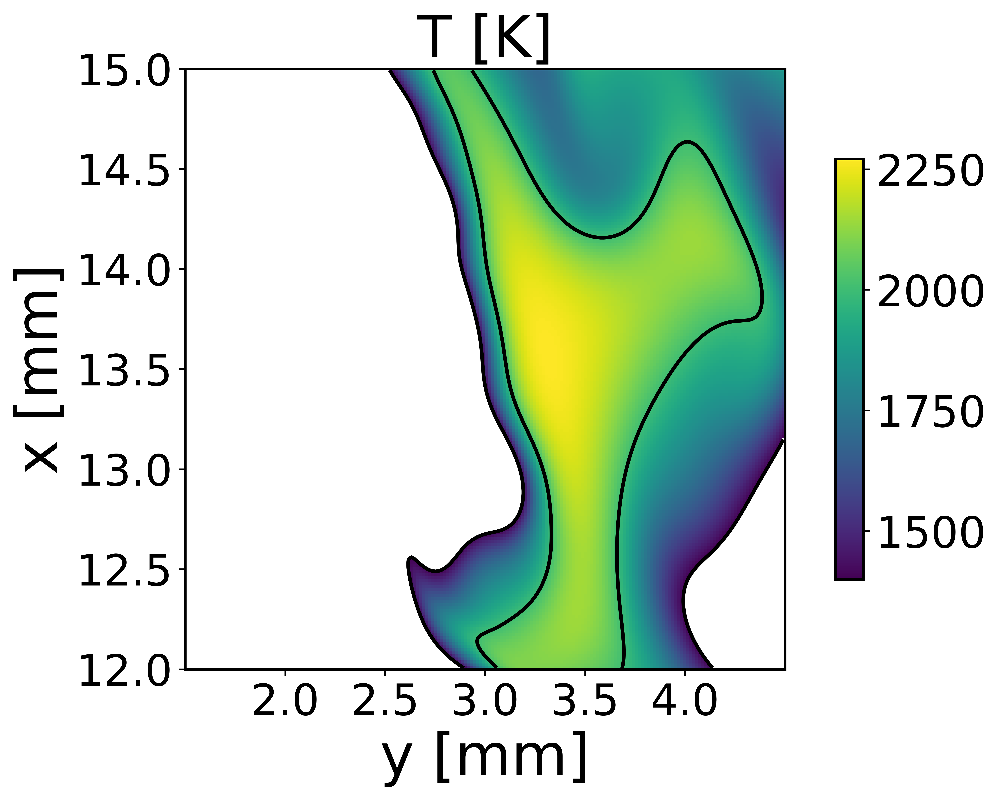

In [4]:
# Plots Temperature on the xy midplane, which was transposed(inverted) as yx plane
field_DNS.plot_z_midplane('T',                 # plots the Temperature
                          levels=[1400, 2000], # isocontours(the black lines) at 1400 and 2000
                          vmin=1400,           # minimum Temperature to plot
                          title='T [K]',       # figure title
                          linewidth=2,         # isocontour line thickness
                          transpose=True,      # invert x and y axes
                          x_name='y [mm]',     # x axis label
                          y_name='x [mm]')     # y axis label

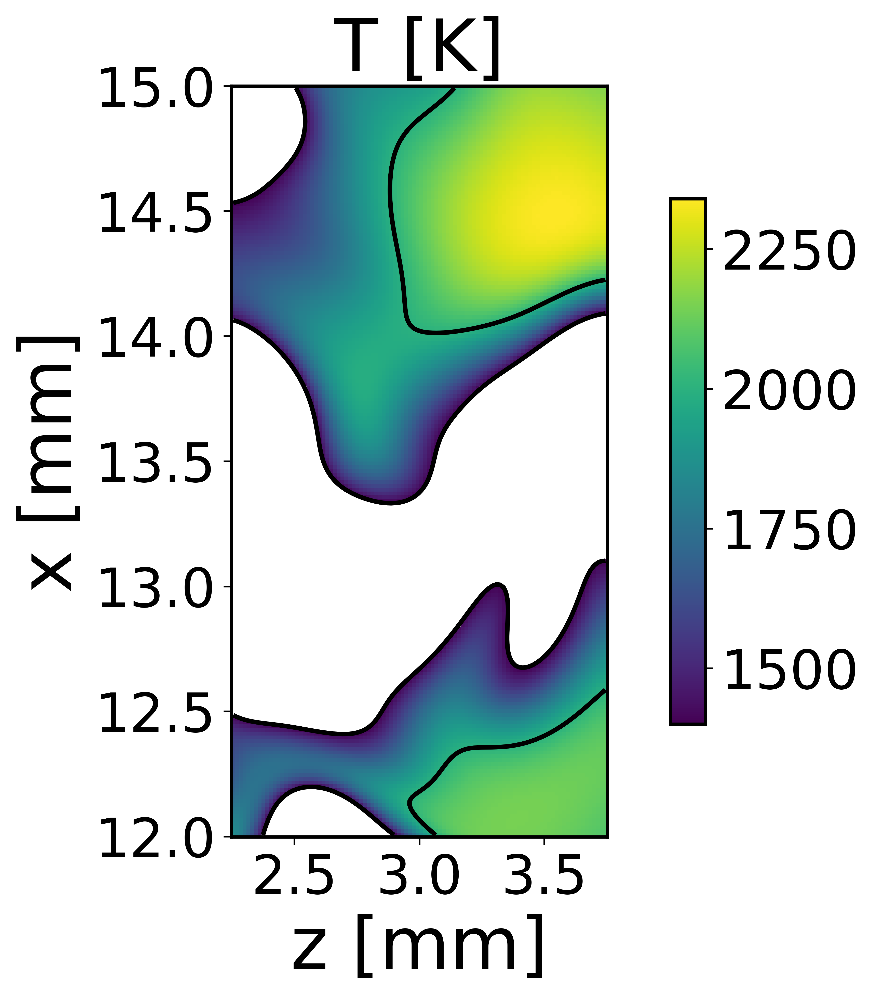

In [5]:
# Plot Temperature on the xz midplane (transposed as zx plane)
field_DNS.plot_y_midplane('T', 
                          levels=[1400, 2000], 
                          vmin=1400, 
                          title='T [K]', 
                          linewidth=2,
                          transpose=True, 
                          x_name='z [mm]', 
                          y_name='x [mm]')

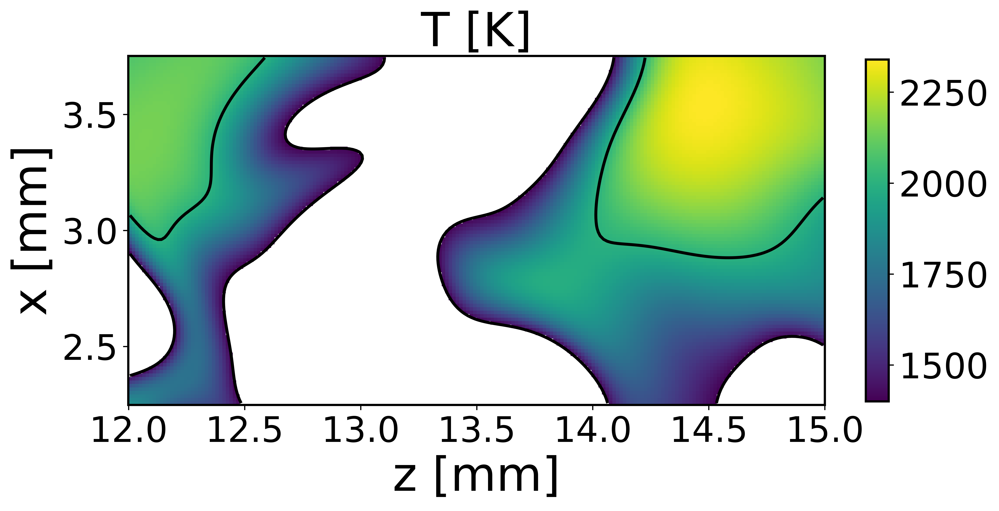

In [3]:
# I wanted to see the difference, so
# Same as above, but without transposition
field_DNS.plot_y_midplane('T', 
                          levels=[1400, 2000], 
                          vmin=1400, 
                          title='T [K]', 
                          linewidth=2,
                          transpose=False, 
                          x_name='z [mm]', 
                          y_name='x [mm]')

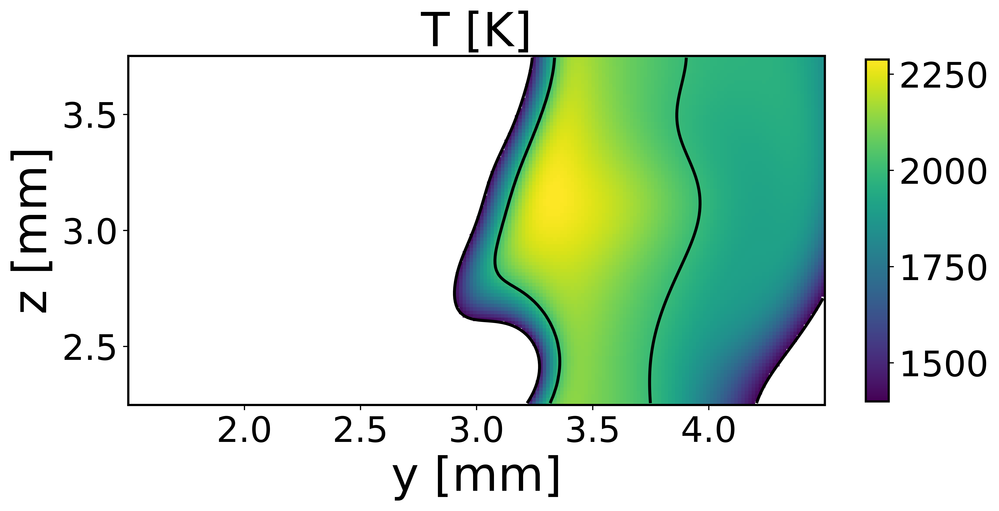

In [7]:
# Plot Temperature on the yz midplane
field_DNS.plot_x_midplane('T', levels=[1400, 2000], vmin=1400, 
                          title='T [K]', linewidth=2)

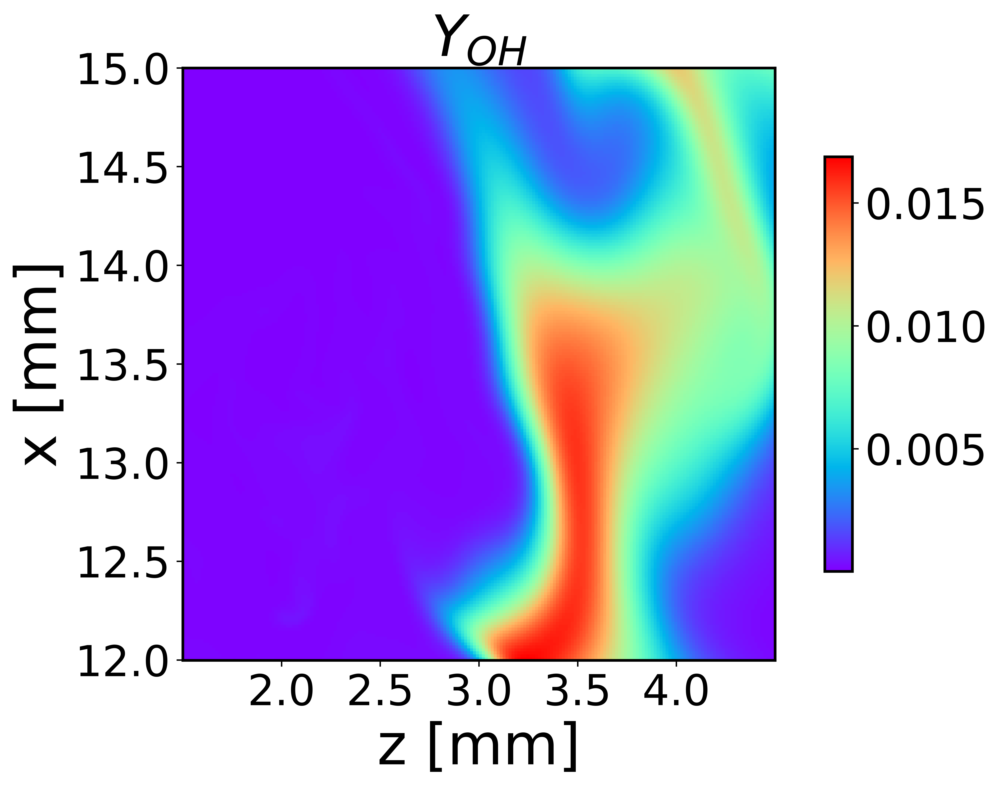

In [25]:
# Plot OH mass fraction on the transposed xy midplane
field_DNS.plot_z_midplane('YOH', # Set here, instead of T(emperature)
                          title=r'$Y_{OH}$', colormap='rainbow', # Tried a different colormap
                          transpose=True, x_name='z [mm]', y_name='x [mm]', save=True)
# Saving Figures: Is handled with the 'save' variable (True/False)
# Alternate Idea: Leave it up to the user (maybe by returning return fig/ax in code)

## Part 2: Computing reaction rates, kinetic Energy, mixture fractions

In [97]:
# Function below computes reaction rates, with the Number of chunks being configurable
field_DNS.compute_reaction_rates()

[9, 9, 9]


The folder 'Lifted_H2_subdomain/data' already contains the reaction rates. 
This operation will overwrite the content of the folder. 
Do you want to continue? ([yes]/no):  no


Operation aborted.


SystemExit: 

/home/pfisun7n/mansurov/miniforge3/envs/apriori-env/lib/python3.13/site-packages/IPython/core/interactiveshell.py:3707: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


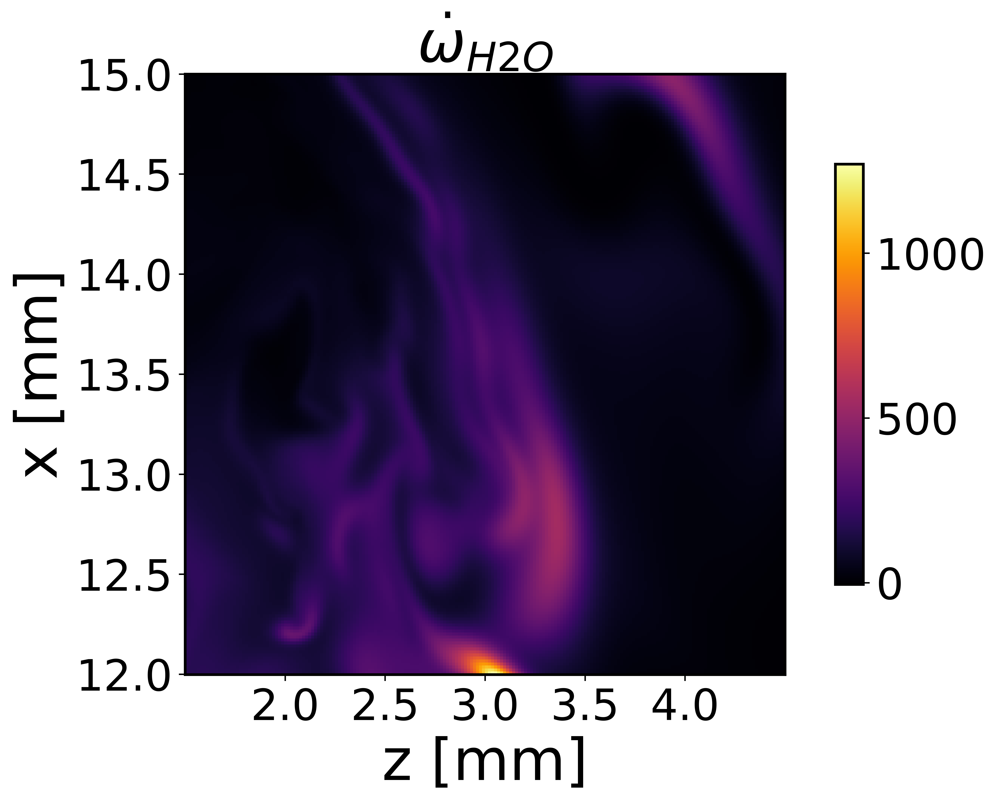

In [37]:
# Plot the computed reaction rates
field_DNS.plot_z_midplane('RH2O_DNS',
                          title=r'$\dot{\omega}_{H2O}$', # I removed Units (e.g. $[kg/m^3/s]$) to save the plot sucessfully
                          colormap='inferno',
                          transpose=True, x_name='z [mm]', y_name='x [mm]', save=True)


The saving subfunction of the contour_plot (and probably others) makes \
title = filename ! \
If characters are used that are forbidden by the file system, then this fails to save the plot

A possible solution is to check and sanitize the plot titles before using them as filenames. \ 
Or directly add an override parameter for the midplane/other plots, e.g. "filename='Plot.pgn'"

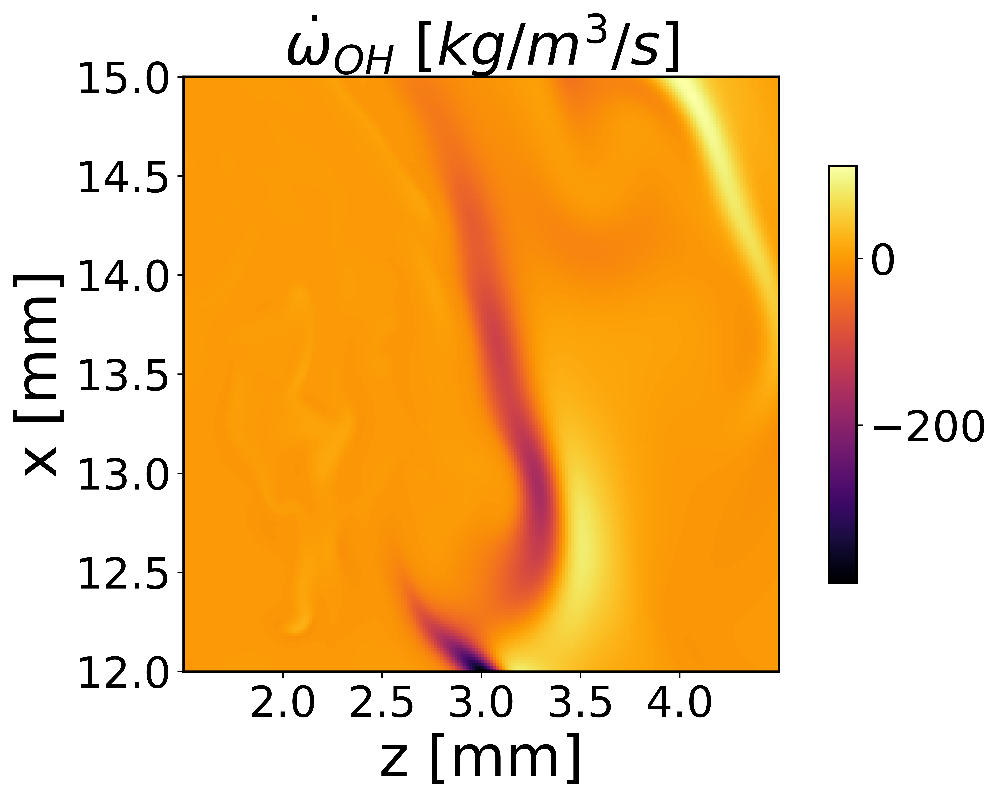

In [38]:
field_DNS.plot_z_midplane('ROH_DNS', 
                          title=r'$\dot{\omega}_{OH}$ $[kg/m^3/s]$', 
                          colormap='inferno',
                          transpose=True, x_name='z [mm]', y_name='x [mm]')

In [39]:
# Computes kinetic energy
# No parameters
# Closure model (DNS or LES) is determined automatically
field_DNS.compute_kinetic_energy()

In [52]:
# Manual computation of Oxidizer and fuel mass fractions (from Quickstart tutorial)
field_DNS.ox = 'O2'     # Defines the species to consider as oxidizer
field_DNS.fuel = 'H2'   # Defines the species to consider as fuel
Y_ox_1=0.233  # Oxygen mass fraction in the oxidizer stream (air)
Y_f_1=0.65*2/(0.65*2+0.35*28) # Hydrogen mass fraction in the fuel stream
# (the fuel stream is composed by X_H2=0.65 and X_N2=0.35)

In [61]:
# Alternative where I use a Cantera gas object
# (Incase I am too lazy to do calculations)

gasOX = ct.Solution('gri30.yaml')
gasF = ct.Solution('gri30.yaml')

gasOX.X = {'O2': 0.21, 'N2': 0.79}
gasF.X = {'H2': 0.65, 'N2': 0.35}

Y_ox_2 = gasOX.Y[gasOX.species_index('O2')]
Y_f_2= gasF.Y[gasF.species_index('H2')]

# Printing to check what mass fractions Cantera calculated
print(gasOX.mass_fraction_dict())
print(gasF.mass_fraction_dict())

{'N2': 0.7670907820415769, 'O2': 0.2329092179584231}
{'H2': 0.11789155488380881, 'N2': 0.8821084451161912}


In [67]:
field_DNS.compute_mixture_fraction(Y_ox_1, Y_f_1, s=2)

np.float64(0.2004399638810007)

In [68]:
field_DNS.compute_mixture_fraction(Y_ox_2, Y_f_2, s=2)

np.float64(0.19932359127841606)


Scatter Plot:
The vector size is too large to display the scatter plot. A random sample of 200000 elements will be extracted from the vector for the plot. You can change this limit with the parameter max_dim


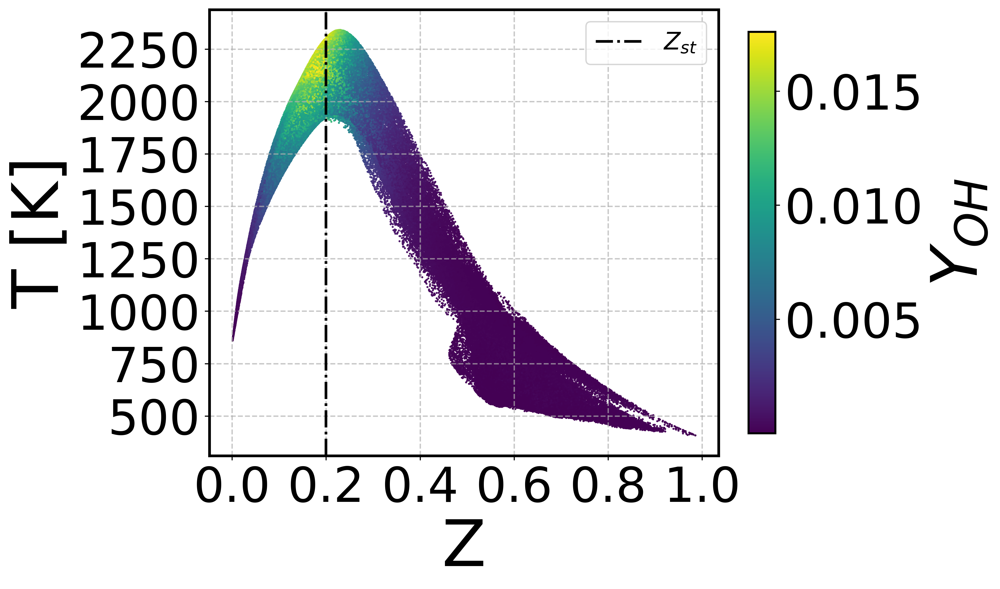

In [76]:
# Scatter plot of the mixture fractions as seen in the Quickstart guide
field_DNS.scatter_Z('T', # Y Axis variable, here it's Temperature
                    c=field_DNS.YOH.value, # set color of the points
                    y_name='T [K]', 
                    cbar_title=r'$Y_{OH}$',
                    max_dim=200000, # Reduced Element count down to 10%
                    save=True
                    )


Scatter Plot:
The vector size is too large to display the scatter plot. A random sample of 200000 elements will be extracted from the vector for the plot. You can change this limit with the parameter max_dim


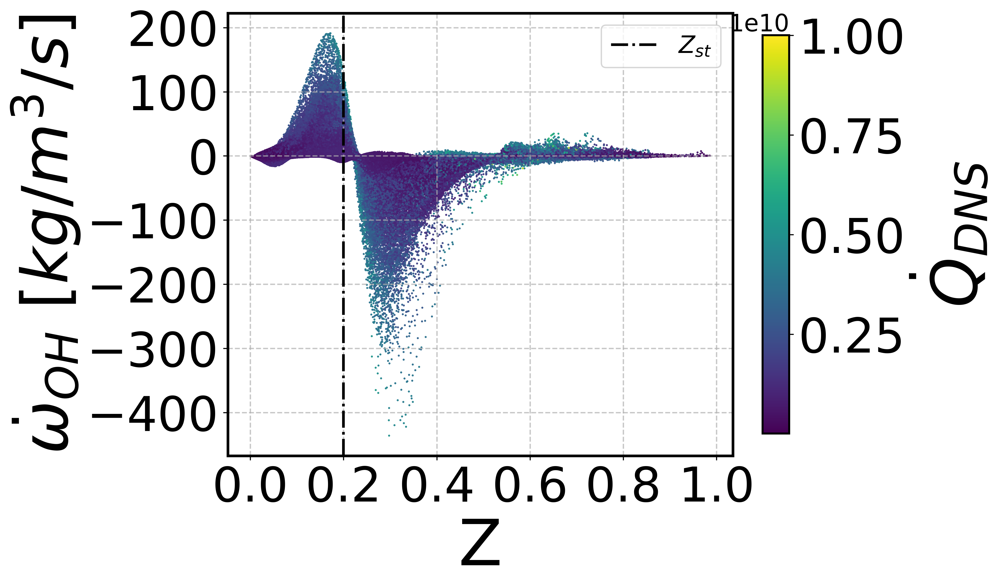

In [77]:
#Second Scatter plot
field_DNS.scatter_Z('ROH_DNS',
                    c=field_DNS.HRR_DNS.value, 
                    y_name=r'$\dot{\omega}_{OH}$ $[kg/m^3/s]$', 
                    cbar_title=r'$\dot{Q}_{DNS}$',
                    max_dim=200000,
                    )

/home/pfisun7n/mansurov/miniforge3/envs/apriori-env/lib/python3.13/site-packages/aPrioriDNS/plot_utilities.py:544: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(title, dpi=dpi, bbox_inches = "tight")


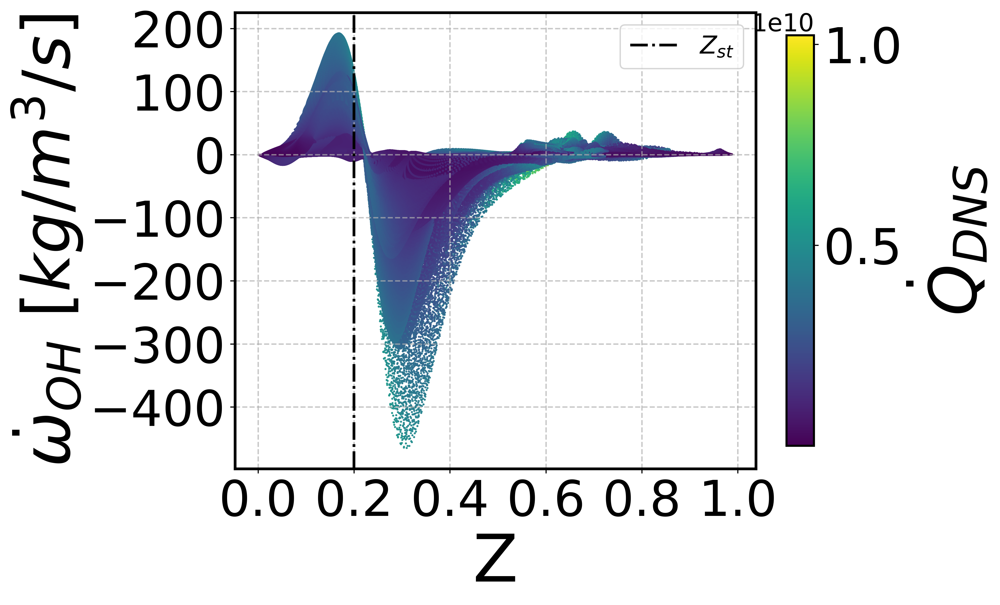

In [81]:
#Copy of the second Scatter plot, where I tried increasing Element count
field_DNS.scatter_Z('ROH_DNS',
                    c=field_DNS.HRR_DNS.value, 
                    y_name=r'$\dot{\omega}_{OH}$ $[kg/m^3/s]$', 
                    cbar_title=r'$\dot{Q}_{DNS}$',
                    max_dim=20000000, # 10x
                    save=True
                    )

## Part 3: Filtering

In [83]:
# Filtering can be performed like the Quickstart example below
# the output of the function is a string with the new folder's name
# It directly gets asspciated with f_string
f_string = field_DNS.filter_favre( # 'filter_favre' (using Favre-averaging) or simply 'filter' (Filters every scalar in the object) are valid
                                filter_size=16, # Filter amplitude
                                filter_type='Gauss') # 'Gauss' or 'Box' are valid


---------------------------------------------------------------
Filtering Field 'Lifted_H2_subdomain'...
Done Filtering Field 'Lifted_H2_subdomain'.
Filtered Field path: 'Filter16FavreGauss'.


In [94]:
# Now Field3D can be reinitialized using this filtered field
field_filtered = aPri.Field3D(f_string) # 'Filter16FavreGauss' should also be valid


---------------------------------------------------------------
Initializing 3D Field

Checking files inside folder Filter16FavreGauss...

Folder structure OK

---------------------------------------------------------------
Building mesh attribute...
Mesh fields read correctly

---------------------------------------------------------------
Reading kinetic mechanism...
Kinetic mechanism file found: Filter16FavreGauss/chem_thermo_tran/li_h2.yaml
Species:
['H2', 'O2', 'H2O', 'H', 'O', 'OH', 'HO2', 'H2O2', 'N2']

---------------------------------------------------------------
Building scalar attributes...
Field attributes:
+-----------+-------------------------------------------------------+
| Attribute |                         Path                          |
+-----------+-------------------------------------------------------+
|     P     |        Filter16FavreGauss/data/P_Pa_id000.dat         |
|    RHO    |      Filter16FavreGauss/data/RHO_kgm-3_id000.dat      |
|     T     |        

Now the filtered and unfiltered heat release rates are plotted, to visualize the effect of filtering

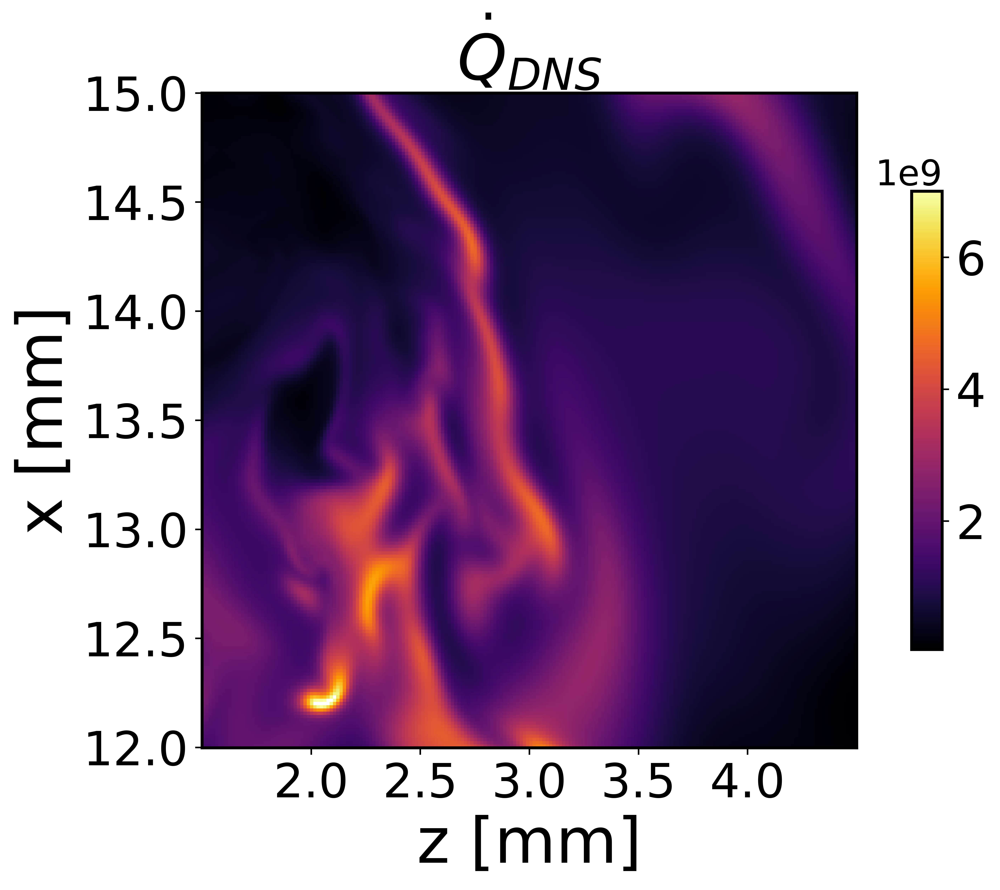

In [95]:
field_DNS.plot_z_midplane('HRR_DNS', # String for Heat release rate
                          title=r'$\dot{Q}_{DNS}$', 
                          colormap='inferno',
                          vmax=7*1e9,
                          transpose=True, x_name='z [mm]', y_name='x [mm]',
                          save=True)

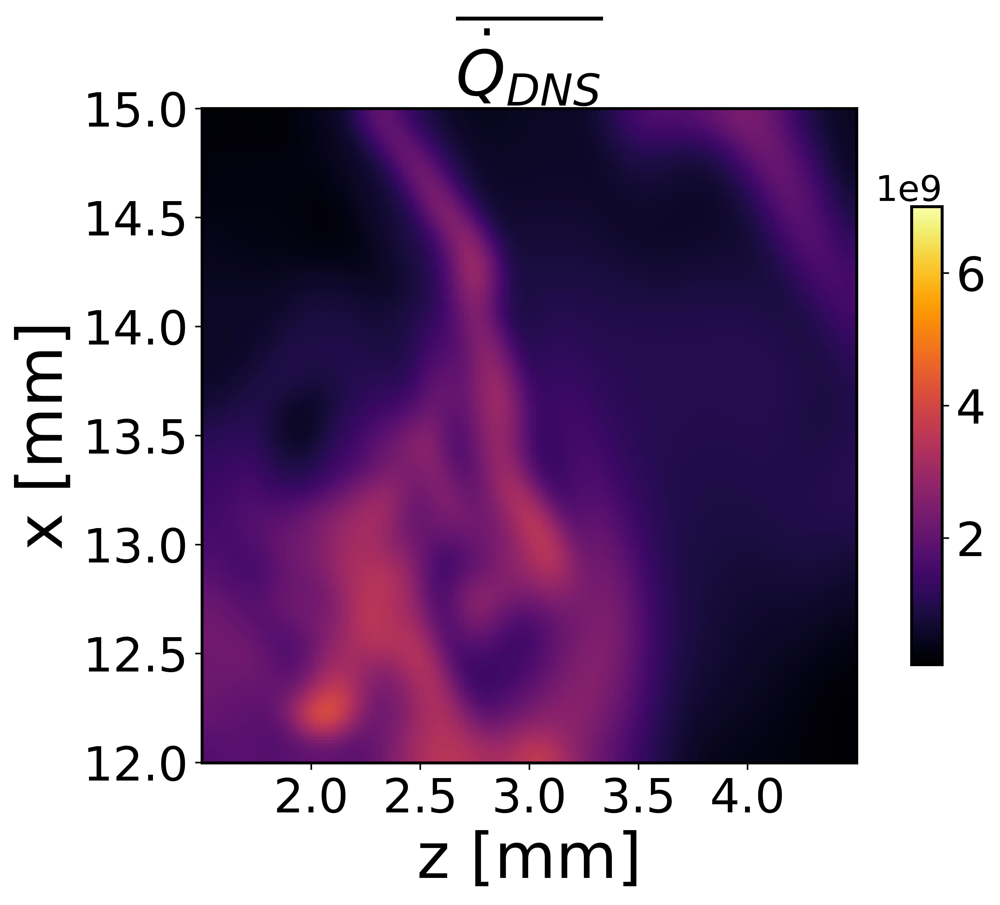

In [96]:
field_filtered.plot_z_midplane('HRR_DNS',
                               title=r'$\overline{\dot{Q}_{DNS}}$', 
                               colormap='inferno',
                               vmax=7*1e9,
                               transpose=True, x_name='z [mm]', y_name='x [mm]',
                               save=True)

## Part 4: Reaction Rates on the Filtered Field, Laminar Finite Rate (LFR) approximation 

In [98]:
# aPriori can directly compute reaction rates with the LFR approximation

# First, the actual (DNS) reaction rates are computed
field_filtered.compute_reaction_rates()

[9, 9, 9]
No such file: 'Filter16FavreGauss/data/HRR_LFR_kgm2s-3_DNS_id000.dat'
Reading file in chunks: read 0/1000
Reading file in chunks: read 1/1000
Reading file in chunks: read 2/1000
Reading file in chunks: read 3/1000
Reading file in chunks: read 4/1000
Reading file in chunks: read 5/1000
Reading file in chunks: read 6/1000
Reading file in chunks: read 7/1000
Reading file in chunks: read 8/1000
Reading file in chunks: read 9/1000
Reading file in chunks: read 10/1000
Reading file in chunks: read 11/1000
Reading file in chunks: read 12/1000
Reading file in chunks: read 13/1000
Reading file in chunks: read 14/1000
Reading file in chunks: read 15/1000
Reading file in chunks: read 16/1000
Reading file in chunks: read 17/1000
Reading file in chunks: read 18/1000
Reading file in chunks: read 19/1000
Reading file in chunks: read 20/1000
Reading file in chunks: read 21/1000
Reading file in chunks: read 22/1000
Reading file in chunks: read 23/1000
Reading file in chunks: read 24/1000
Readi

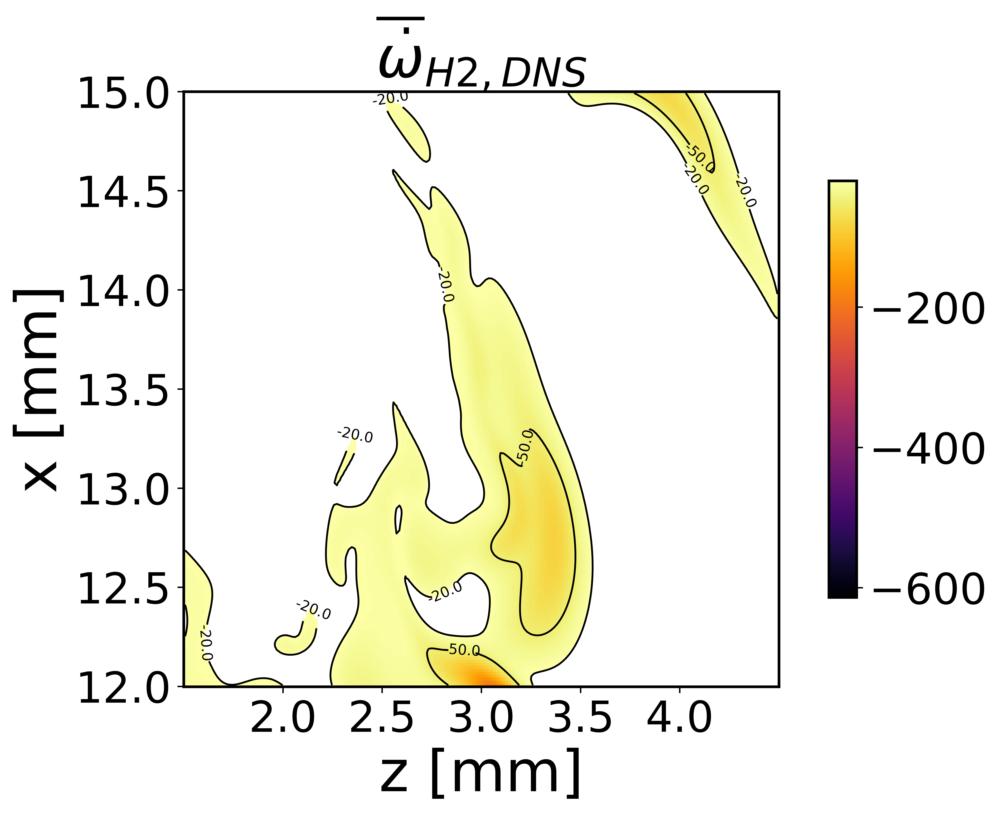

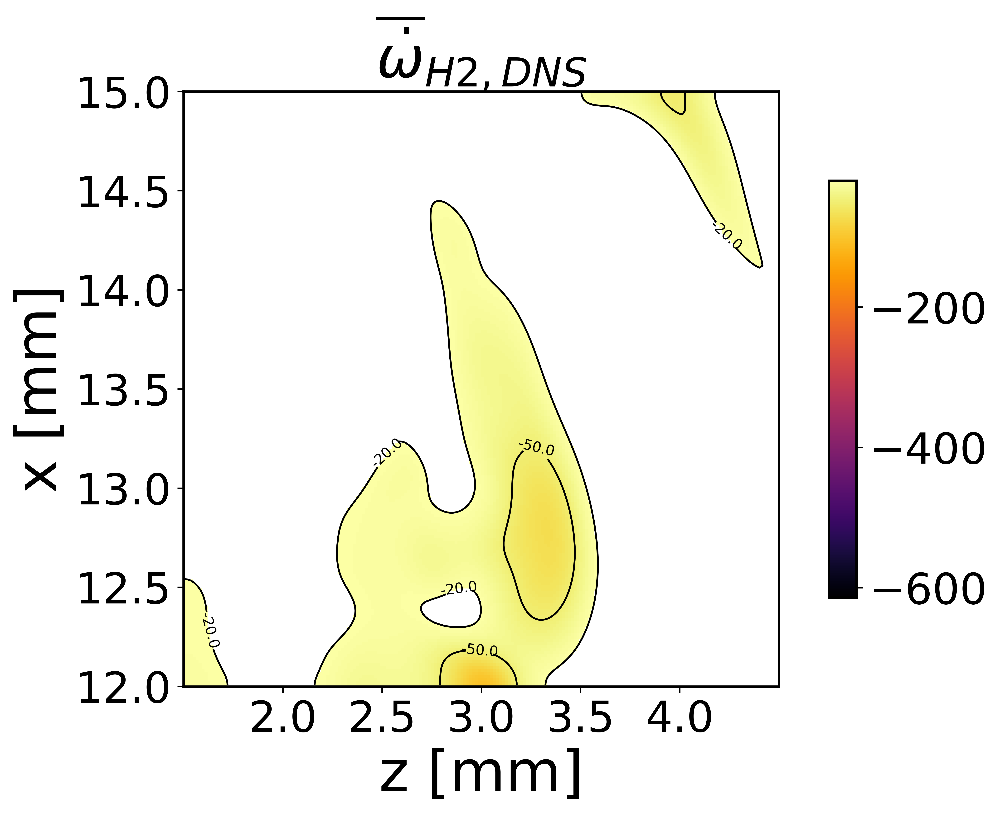

In [100]:
# Results on the filtered field are compared visually 
# I mixed in plots of the unfiltered DNS field with the same vmin/max, to see the difference
field_DNS.plot_z_midplane('RH2_DNS',
                          title=r'$\overline{\dot{\omega}}_{H2,DNS}$', 
                          vmax=-20,
                          vmin=field_filtered.RH2_LFR.z_midplane.min(),
                          levels=[-300, -50, -20],
                          labels=True,
                          colormap='inferno',
                          transpose=True, x_name='z [mm]', y_name='x [mm]')

field_filtered.plot_z_midplane('RH2_DNS', # Same as above with DNS field
                          title=r'$\overline{\dot{\omega}}_{H2,DNS}$', 
                          vmax=-20,
                          vmin=field_filtered.RH2_LFR.z_midplane.min(),
                          levels=[-300, -50, -20],
                          labels=True,
                          colormap='inferno',
                          transpose=True, x_name='z [mm]', y_name='x [mm]')

In [101]:
field_filtered.plot_z_midplane('RH2_LFR', # '_LFR' sets it to use the LFR approximation
                              title=r'$\overline{\dot{\omega}}_{H2,LFR}$', 
                              vmax=-20,
                              vmin=field_filtered.RH2_LFR.z_midplane.min(),
                              levels=[-300, -50, -20],
                              labels=True,
                              colormap='inferno',
                              transpose=True, x_name='z [mm]', y_name='x [mm]')

# Trying to query LFR in original DNS field errors out
# Not implemented
field_DNS.plot_z_midplane('RH2_LFR', 
                              title=r'$\overline{\dot{\omega}}_{H2,LFR}$', 
                              vmax=-20,
                              vmin=field_filtered.RH2_LFR.z_midplane.min(),
                              levels=[-300, -50, -20],
                              labels=True,
                              colormap='inferno',
                              transpose=True, x_name='z [mm]', y_name='x [mm]')

ValueError: The attribute 'RH2_LFR' is not valid. 
Valid attributes are: 
P
RHO
T
U_X
U_Y
U_Z
YH2
YO2
YH2O
YH
YO
YOH
YHO2
YH2O2
YN2
RH2_DNS
RO2_DNS
RH2O_DNS
RH_DNS
RO_DNS
ROH_DNS
RHO2_DNS
RH2O2_DNS
RN2_DNS
K_DNS
HRR_DNS
Mu
Z